In [1]:
# importing necessary libraries and configurations
import matplotlib.pyplot as plt
import pandas as pd

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

%matplotlib inline
plt.style.use("seaborn-white")

In [2]:
# loading datasets
df = pd.read_csv("Datasets/df_clean.csv")

In [3]:
# data cleaning and indexing
drop = ["zip_code", "latitude", "longitude"]

df.drop(drop, axis=1, inplace=True)
df.occurred_date_time = df.occurred_date_time.astype("datetime64")
df.set_index(["occurred_date_time"], inplace=True)
df.sort_index(inplace=True)

# examining the overall dataframe
display(df.shape)
display(df.head())
display(df.tail())

(2294804, 15)

,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,
2003-01-01,IDENTITY THEFT,N,2008-05-10 18:36:00,RESIDENCE / HOME,7312 WHISPERING OAKS DR,5.0,FR,1,NaN,2008-05-13 00:00:00,2003,1,1,1,0
2003-01-01,IDENTITY THEFT,N,2009-08-07 14:23:00,RESIDENCE / HOME,6800 MC NEIL DR,6.0,AD,4,NaN,NaN,2003,1,1,1,0
2003-01-01,INDECENCY WITH A CHILD/CONTACT,Y,2007-05-10 09:52:00,RESIDENCE / HOME,9400 BLOCK GROUSE MEADOW LN,4.0,ED,1,C,2007-07-02 00:00:00,2003,1,1,1,0
2003-01-01,IDENTITY THEFT,N,2012-01-23 09:41:00,SPECIALTY STORE (TV FUR ETC.),1533 CUTTING HORSE LN,7.0,ED,4,N,2012-01-23 00:00:00,2003,1,1,1,0
2003-01-01,INDECENCY WITH A CHILD/CONTACT,Y,2017-10-02 21:14:00,RESIDENCE / HOME,1200 BLOCK AUSTIN HIGHLANDS BLVD,2.0,FR,4,N,2018-08-02 00:00:00,2003,1,1,1,0


,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,
2020-12-19 18:55:00,BURGLARY OF RESIDENCE,N,2020-12-19 19:14:00,RESIDENCE / HOME,4404 E OLTORF ST,3.0,HE,4,NaN,NaN,2020,12,51,19,18
2020-12-19 19:00:00,HARASSMENT,N,2020-12-19 21:07:00,RESIDENCE / HOME,4806 MISTY SLOPE LN,2.0,FR,8,NaN,NaN,2020,12,51,19,19
2020-12-19 19:33:00,THEFT FROM AUTO,N,2020-12-19 19:33:00,RESIDENCE / HOME,504 BLUE VALLEY DR,2.0,FR,3,NaN,NaN,2020,12,51,19,19
2020-12-19 19:38:00,FAMILY DISTURBANCE,N,2020-12-19 19:38:00,RESIDENCE / HOME,815 W SLAUGHTER LN,5.0,FR,2,NaN,NaN,2020,12,51,19,19
2020-12-19 20:57:00,AUTO THEFT,N,2020-12-19 20:57:00,GAS / SERVICE STATIONS,1747 E OLTORF ST,3.0,HE,2,NaN,NaN,2020,12,51,19,20


In [4]:
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)
df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

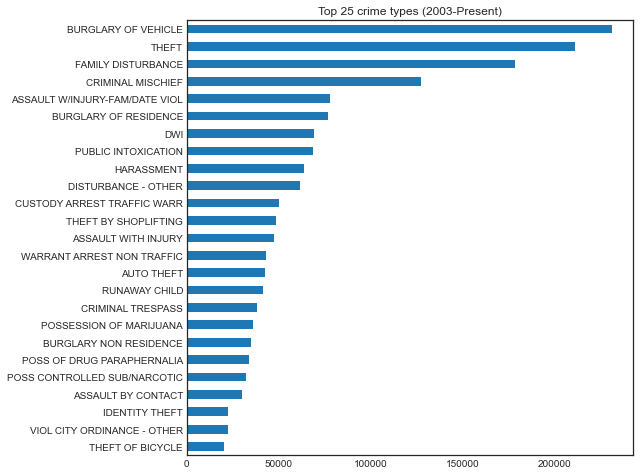

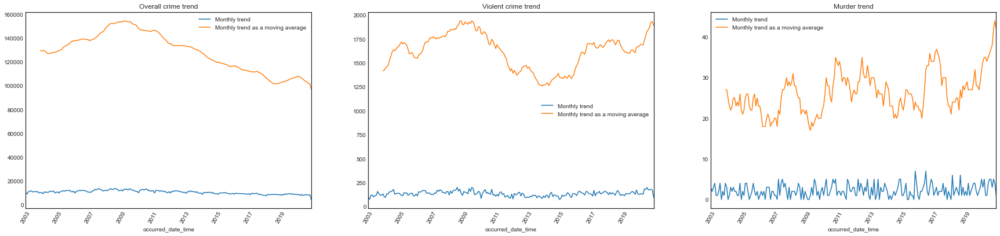

In [5]:
# Top 25 crime types
df.highest_offense_description.value_counts().head(25).sort_values().plot.barh(
    figsize=(8, 8), title="Top 25 crime types (2003-Present)"
)
plt.show()

# Visualizing trends (overall, violent, and murder)
fig, axs = plt.subplots(ncols=3, figsize=(30, 6.25))
df.resample("M").size().plot(ax=axs[0])
df.resample("M").size().rolling(12).sum().plot(
    title="Overall crime trend", rot=60, ax=axs[0]
)
axs[0].legend(["Monthly trend", "Monthly trend as a moving average"])
df_viol.resample("M").size().plot(ax=axs[1])
df_viol.resample("M").size().rolling(12).sum().plot(
    title="Violent crime trend", rot=60, ax=axs[1]
)
axs[1].legend(["Monthly trend", "Monthly trend as a moving average"])
df_viol_mur.resample("M").size().plot(ax=axs[2])
df_viol_mur.resample("M").size().rolling(12).sum().plot(
    title="Murder trend", rot=60, ax=axs[2]
)
axs[2].legend(["Monthly trend", "Monthly trend as a moving average"])
plt.show()

## Predicting crime rates with Facebook Prophet 

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


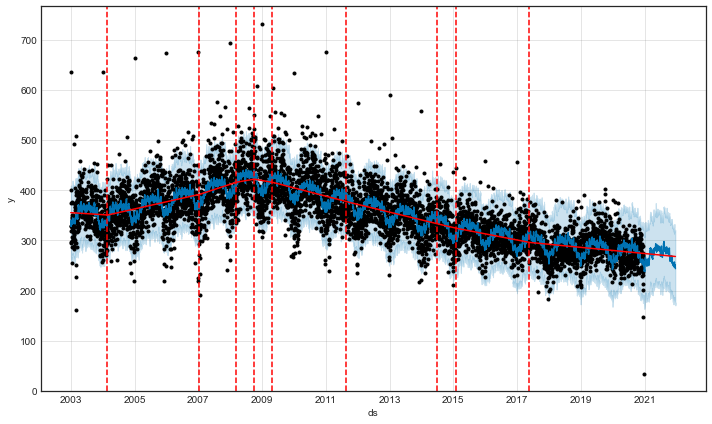

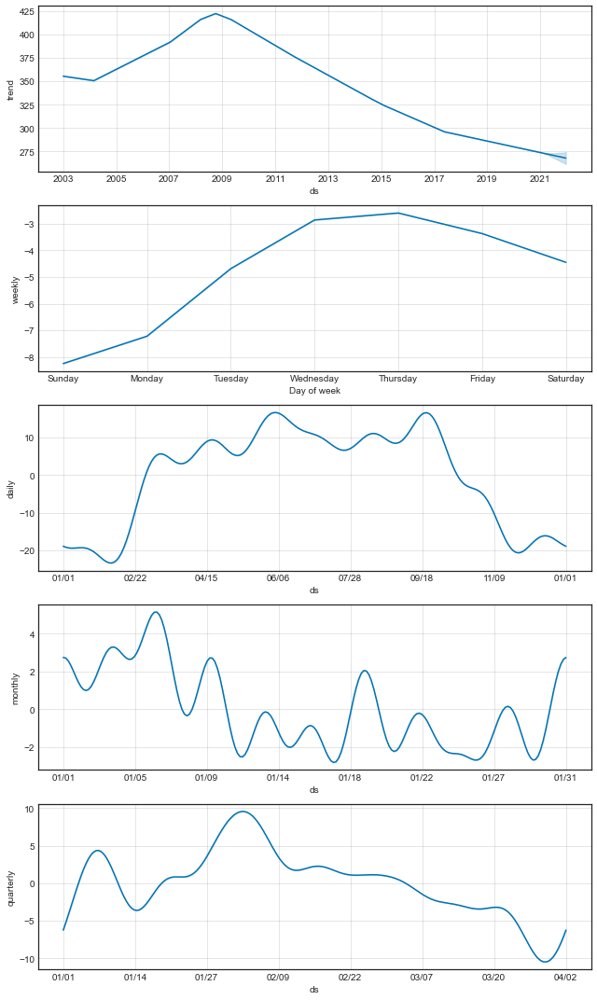

In [6]:
# forecasting for overall crime
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95, yearly_seasonality=False)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)

fig2_1 = plot_plotly(m, forecast)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


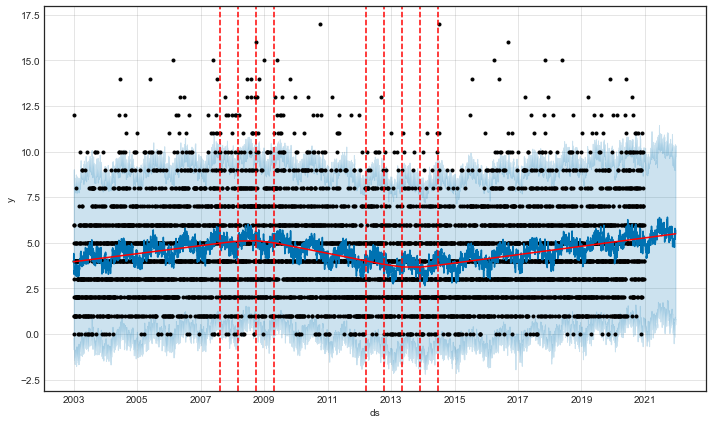

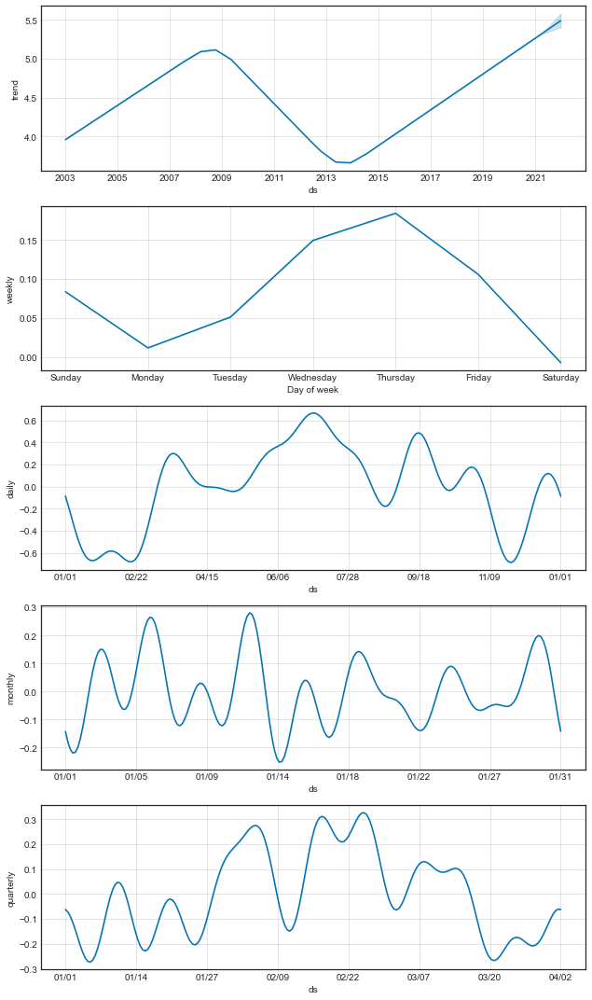

In [7]:
# forecasting for violent crime
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
forecast = n.predict(future)

fig = n.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), n, forecast)

fig3 = n.plot_components(forecast)

fig3_1 = plot_plotly(n, forecast)
fig3_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


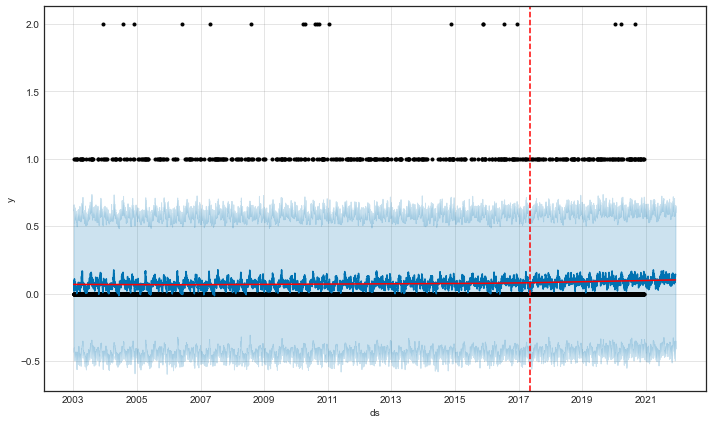

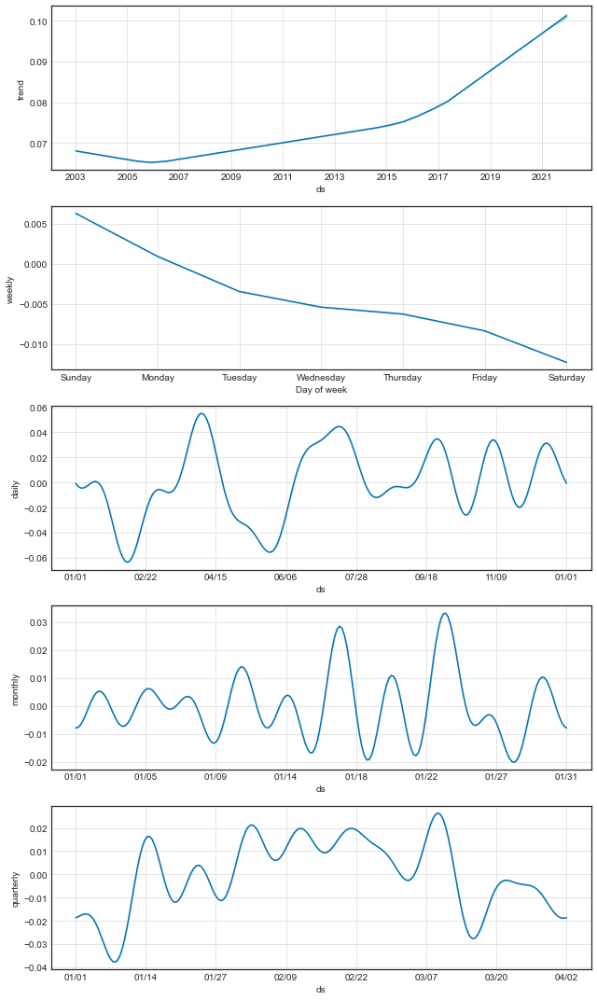

In [8]:
# forecasting for murder rates
df_viol_mur_fbprophet = df_viol_mur

df_viol_mur_o = df_viol_mur_fbprophet.resample("D").size().reset_index()
df_viol_mur_o.columns = ["date", "daily_crime_count"]
df_viol_mur_o_final = df_viol_mur_o.rename(
    columns={"date": "ds", "daily_crime_count": "y"}
)

o = Prophet(interval_width=0.95, yearly_seasonality=False)
o.add_seasonality(name="monthly", period=30.5, fourier_order=10)
o.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
o.add_seasonality(name="weekly", period=52, fourier_order=10)
o.add_seasonality(name="daily", period=365, fourier_order=10)
o.fit(df_viol_mur_o_final)

future = o.make_future_dataframe(periods=365, freq="D")
forecast = o.predict(future)

fig = o.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), o, forecast)

fig4 = o.plot_components(forecast)

fig4_1 = plot_plotly(o, forecast)
fig4_1